## Домашнее задание
Практический проект по построению системы поиска аномалий.
<br>Цель: В этом домашнем задании вам предстоит настроить систему по поиску аномалий в банковских транзакциях. Мало того, что аномальных значений в данных меньше одного процента, так еще и переменные анонимизированы и представляют собой первые 28 главных компонент, полученных после PCA преобразования оригинальных данных (о которых мы ничего не знаем). Смогут ли бравые unsupervised методы справится с такой задачей? Можно ли работать в таких условиях? Кто подставил кролика Роджера? Ответы на некоторые их этих вопросов вы узнаете после выполнения задания :)
1. Скачайте датасет с https://www.kaggle.com/mlg-ulb/creditcardfraud#creditcard.csv и 

2. Проведите небольшой EDA (гистограммы и описательные статистики - обязательно)

3. Воспользуйтесь процентом аномалий, посчитанным по переменной Class, как "экспертной оценкой" загрязненности нашего датасета

4. Попробуйте построить различные модели и алгоритмы, разобранные на занятии, используя полученную экспертную оценку для настройки параметров

5. Воспользуйтесь стандартными методами оценки качества бинарной классификации (особенно хорошо подойдёт classification report и confusion matrix), и, используя предсказания моделей и переменную Class, проверьте, действительно ли модели справляются со своей задачей и на сколько хорошо они это делают

6. При помощи tSNE и/или UMAP, постройте сжатое представление исходных данных и проверьте, действительно ли аномалии лежат достаточно далеко от основной массы точек
Критерии оценки: Настроены и построены модели и методы, разобранные на занятии - 6 баллов

Посчитаны метрики и дана оценка качества работы алгоритмов - 2 балла

Визуализация работы алгоритмов при помощи tSNE/UMAP - 2 балла

- Time - Number of seconds elapsed between this transaction and the first transaction in the dataset
- V1 - may be result of a PCA Dimensionality reduction to protect user identities and sensitive features(v1-v28)
- V28 - abc
- Amount - Transaction amount
- Class - 1 for fraudulent transactions, 0 otherwise

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
raw_data = pd.read_csv('creditcard.csv')

# 1) EDA

In [4]:
raw_data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
raw_data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


- все данные заполнены и имеют числовые значения в различных интервалах

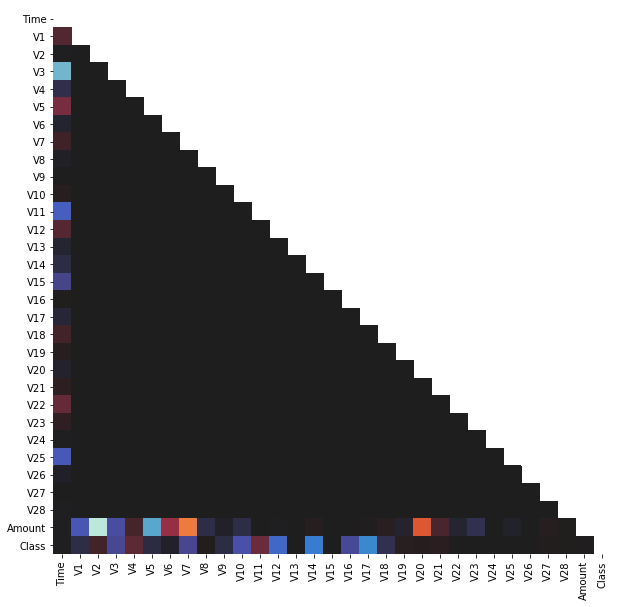

In [3]:
plt.figure(figsize=(10,10))

corr_matrix = raw_data.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(np.bool))

sns.heatmap(lower, cbar=False, center=0)

- наблюдается корреляция для параметров Time, Amount, Class

In [4]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.5)|(lower[column] < -0.5))
]
high_corr

['V2']

In [5]:
# для уменьшения размерности и уменьшения вероятности переобучения убираем скоррелированные параметры
data = raw_data.drop(high_corr, axis=1)

In [6]:
other_features = list(data.drop(['Time', 'Amount', 'Class'], axis=1).columns)

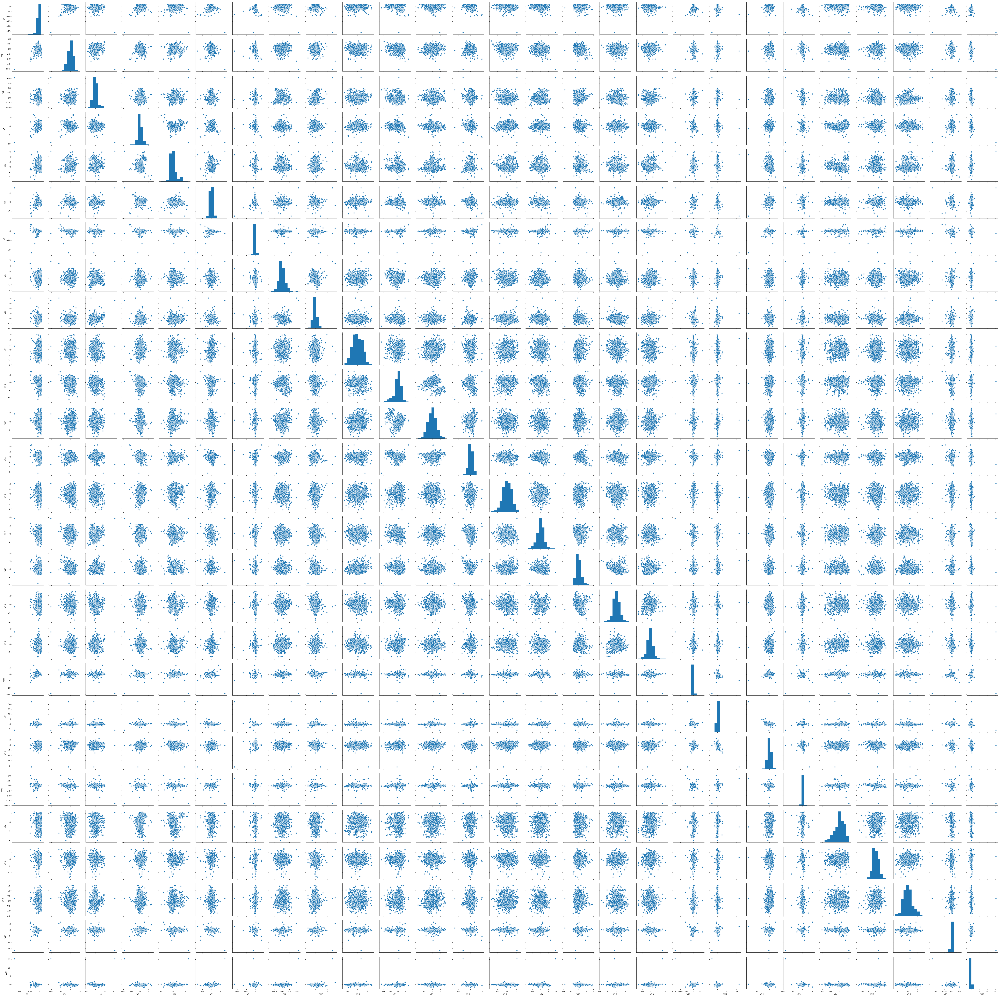

In [8]:
sns.pairplot(data[other_features].sample(1000))

In [7]:
# Выберем параметры с наиболее сложной формой для последующей визуализации на pairplots
pairplot_features = ['V1', 'V5', 'V7', 'V11', 'V12', 'V16', 'V19', 'V28']

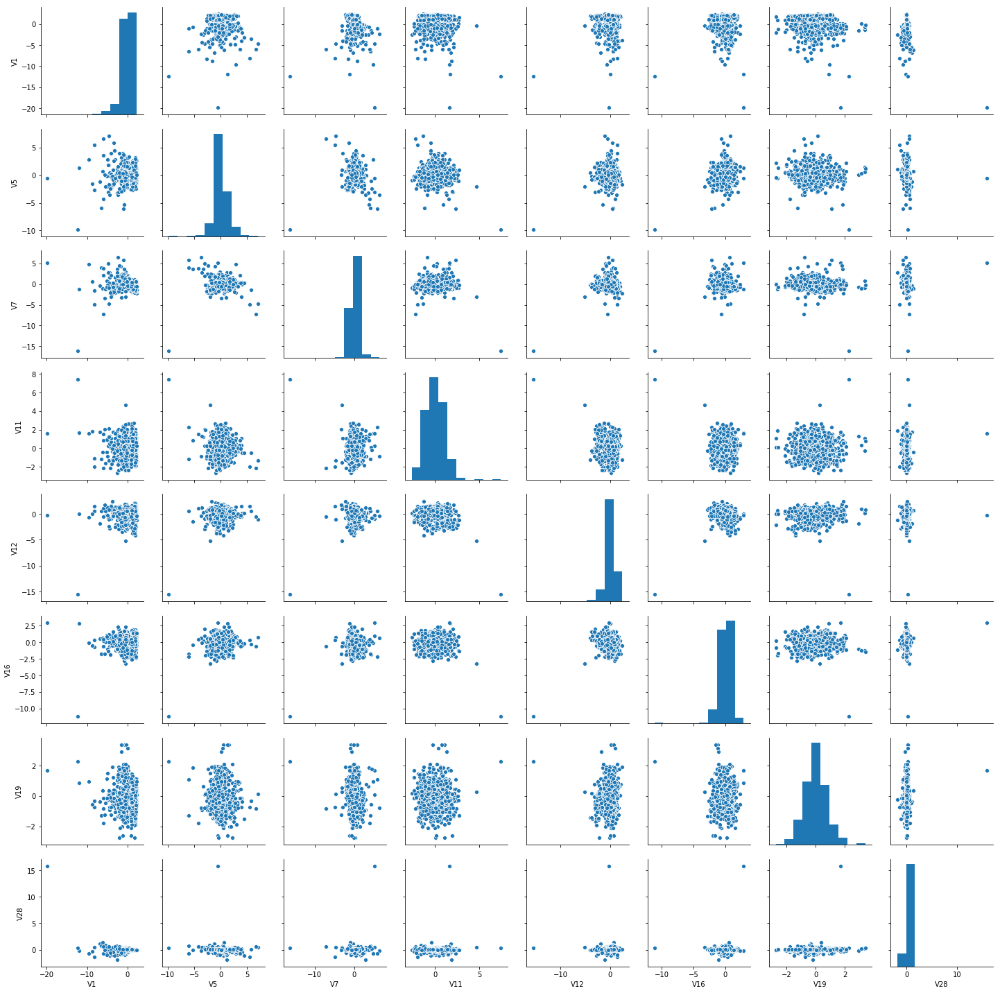

In [12]:
sns.pairplot(data[pairplot_features].sample(1000))

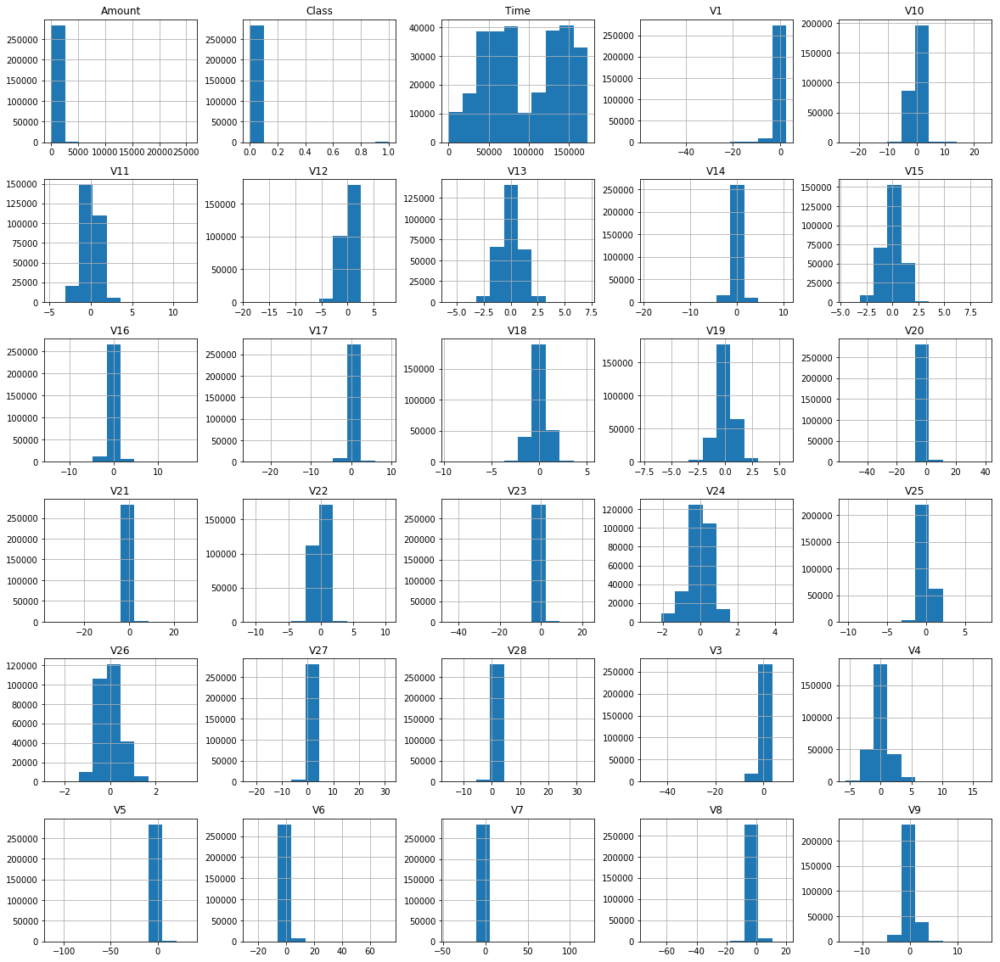

In [13]:
_ = data.hist(figsize=(20, 20))

- наблюдается небольшое количество нормально-распределенных данных
- большинство данных имеет распределение в основном вырожденное около нуля с хвостами выбросов

In [14]:
data['Class'].value_counts() / data['Class'].count()

0    0.998273
1    0.001727
Name: Class, dtype: float64

- процент аномалий (представителей класса 1 составляет 0.2%

In [8]:
anomaly_percent = 0.002

In [9]:
data_features = data.drop('Class', axis=1)

# 2) Detecting anomalies

# 2.1) DistanceOutliers
Кластеризация distance-based

In [10]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

class DistanceOutliers(BaseEstimator):
    def __init__(self, metric='euclidean', percentile=(100 - anomaly_percent*100)):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions
    
scaler = RobustScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features), 
    columns=data_features.columns
)

- методы, работающие с расстоянием требуют использования шкалированных данных
- наиболее подходящий скейлер для данных с выбросами является RobustScaler, использующий расчеты на медиане и IQR

In [11]:
def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), 100*sum(outliers)/len(outliers)))

In [12]:
citiblock_model = DistanceOutliers(metric='cityblock', percentile=100*(1-anomaly_percent))
citiblock_model.fit(scaled_data)
cityblock_outliers = citiblock_model.predict(scaled_data)
anomalies_report(cityblock_outliers)

Total number of outliers: 570
Percentage of outliers:   0.20%


# 2.2) One-Class SVM
Linear unsupervised model-based

In [14]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=anomaly_percent, gamma='auto')
one_class_svm.fit(scaled_data)
svm_outliers = one_class_svm.predict(scaled_data)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])
anomalies_report(svm_outliers)

Total number of outliers: 2777
Percentage of outliers:   0.98%


# 2.3) Isolation forest
Non-linear unsupervised model-based

In [15]:
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=100, contamination=anomaly_percent, 
                                   max_features=1.0, bootstrap=True, behaviour="new")
isolation_forest.fit(scaled_data)

isolation_outliers = isolation_forest.predict(scaled_data)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])
anomalies_report(isolation_outliers)

Total number of outliers: 570
Percentage of outliers:   0.20%


# 3) Final comparison

In [16]:
summary = np.concatenate((
    [cityblock_outliers],
    [svm_outliers],
    [isolation_outliers]))

summary = pd.DataFrame(summary.T,  columns=['cityblock', 'svm', 'isolation'])
summary.head()

,cityblock,svm,isolation
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0


In [17]:
summary.sum(axis=1).value_counts()

0    281682
1      2566
2       326
3       233
dtype: int64

(array([2.81682e+05, 0.00000e+00, 0.00000e+00, 2.56600e+03, 0.00000e+00,
        0.00000e+00, 3.26000e+02, 0.00000e+00, 0.00000e+00, 2.33000e+02]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

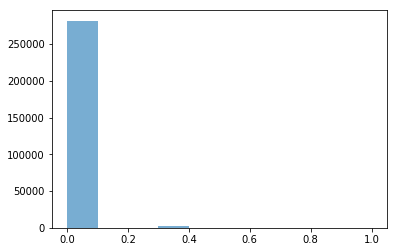

In [18]:
outlier_score = summary.mean(axis=1)
simple_score = outlier_score.apply(lambda x: 0 if x < 0.4 else 0.5 if x < 0.8 else 1)
summary['avg_all'] = simple_score
plt.hist(outlier_score, alpha=0.6)

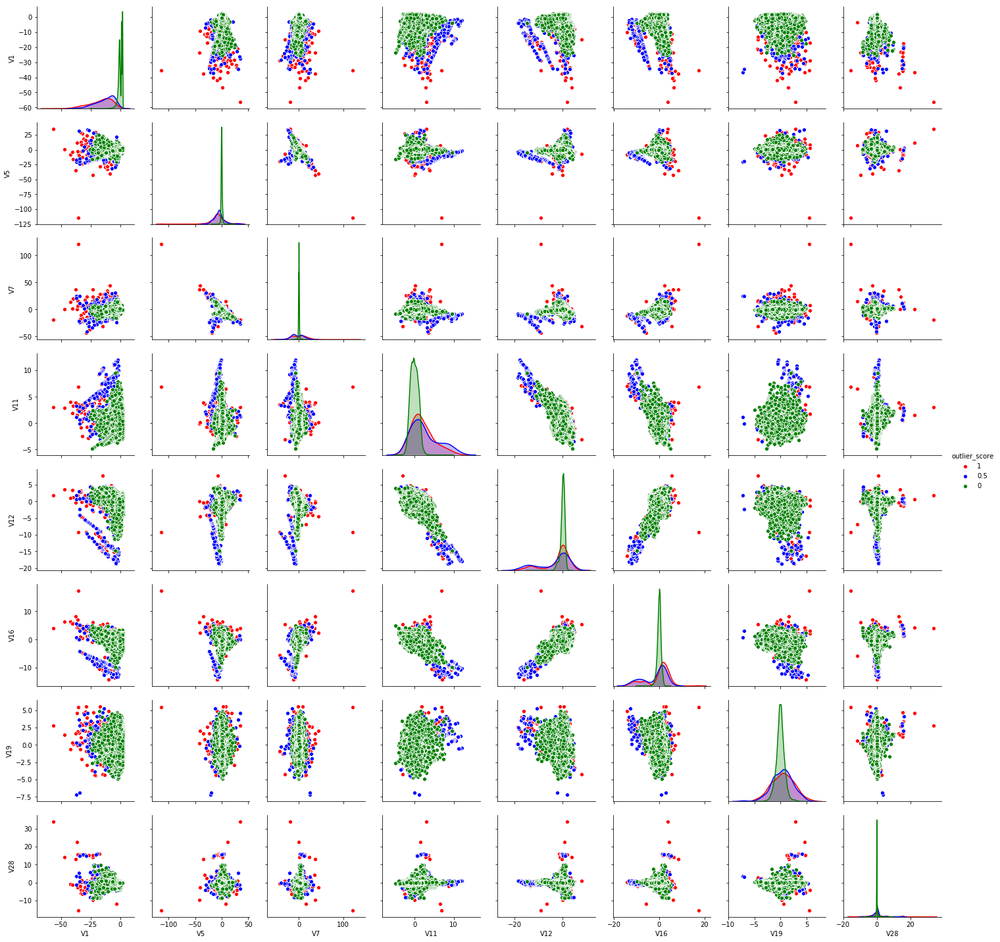

In [64]:
labeled_data = data_features[pairplot_features].copy()
labeled_data['outlier_score'] = simple_score

custom_palette = {0:'g', 0.5:'b', 1.0:'r'}

sns.pairplot(data=labeled_data, vars=pairplot_features, 
             hue='outlier_score',
             hue_order=[1, 0.5, 0],
             palette=custom_palette)

- использованние усредненного скора по различным методам детекции аномалий позволило определить нелинейную форму распределений
- outlier_score = 0.5 все же стоит отнести к нормальным плотным данным, а не к аномалиям - иначе отсечение аномалий более линейно и слишком в большом объеме

# 4) Quality of unsupervised learning methods vs true data (sklearn.metrics)

In [21]:
from sklearn.metrics import classification_report, confusion_matrix

In [22]:
summary = summary.join(raw_data['Class'])
summary.head()

,cityblock,svm,isolation,avg_all,Class
0,0,0,0,0.0,0
1,0,0,0,0.0,0
2,0,0,0,0.0,0
3,0,0,0,0.0,0
4,0,0,0,0.0,0


In [23]:
outlier_score.unique()

array([0.        , 0.33333333, 1.        , 0.66666667])

In [24]:
simple_score = outlier_score.apply(lambda x: 0 if x < 0.4 else 1)
summary['avg_all'] = simple_score

In [25]:
for method in ['cityblock', 'svm', 'isolation', 'avg_all']:
    print(method)
    print(classification_report(summary['Class'], summary[method]))

cityblock
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.20      0.23      0.21       492

    accuracy                           1.00    284807
   macro avg       0.60      0.61      0.61    284807
weighted avg       1.00      1.00      1.00    284807

svm
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    284315
           1       0.05      0.28      0.09       492

    accuracy                           0.99    284807
   macro avg       0.52      0.64      0.54    284807
weighted avg       1.00      0.99      0.99    284807

isolation
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.25      0.29      0.27       492

    accuracy                           1.00    284807
   macro avg       0.62      0.64      0.63    284807
weighted avg       1.00      1.00      1.00    284

,cityblock,svm,isolation,avg_all
TN,283858,281678,283886,283879
FN (type 2 error),457,2637,429,436
FP (type 1 error),379,352,351,369
TP,113,140,141,123


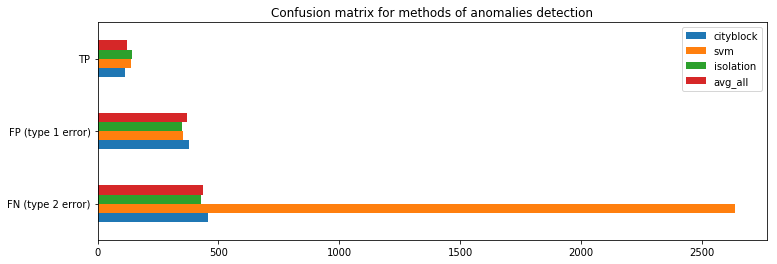

In [74]:
confusion_df = pd.DataFrame()

for method in ['cityblock', 'svm', 'isolation', 'avg_all']:
    confusion_df = pd.concat([confusion_df, pd.Series(confusion_matrix(summary['Class'],
                            summary[method]).flatten())], axis=1)
    
confusion_df.index = ['TN', 'FN (type 2 error)', 'FP (type 1 error)', 'TP']
confusion_df.columns = ['cityblock', 'svm', 'isolation', 'avg_all']

confusion_df.loc[['FN (type 2 error)', 'FP (type 1 error)', 'TP']].plot(kind='barh', figsize=(12,4))
plt.title('Confusion matrix for methods of anomalies detection')
confusion_df

Наиболее качественная детекция аномалий у метода **Isolation forest**: наибольшее количество правильного детектирования аномалий и наименькая ошибка 1го рода. Уссредненный метод avg_all не смог показать наиболее лучшего результата возможно из-за метода One-Class SVM, который совершил сильно больше ложно-отрицательных предсказаний.

# 5) Visualizations

In [42]:
from joblib import Parallel, delayed
labeled_data = data[pairplot_features].copy()
names = {0: 'cityblock_outliers',
         1: 'svm_outliers',
         2:'isolation_outliers'}

def save_pairplot(outliers, index):
    global labeled_data, pairplot_features, names
    
    labeled_data['is_outlier'] = outliers
    sns_plot = sns.pairplot(data=labeled_data, vars=pairplot_features,
                     hue='is_outlier', hue_order=[1, 0],
                     markers=['x', 'o'],  palette='bright')
    sns_plot.savefig(f'pairplot {names[index]}.png')
    plt.clf()

In [43]:
_ = Parallel(n_jobs=4)(
    delayed(save_pairplot)(outliers, ix)
    for ix, outliers in enumerate([cityblock_outliers, svm_outliers, isolation_outliers])
)

- построены pairplots для рассмотренные 3 методов поиска аномалий - в приложенных файлах, ниже пример на isolation_outliers

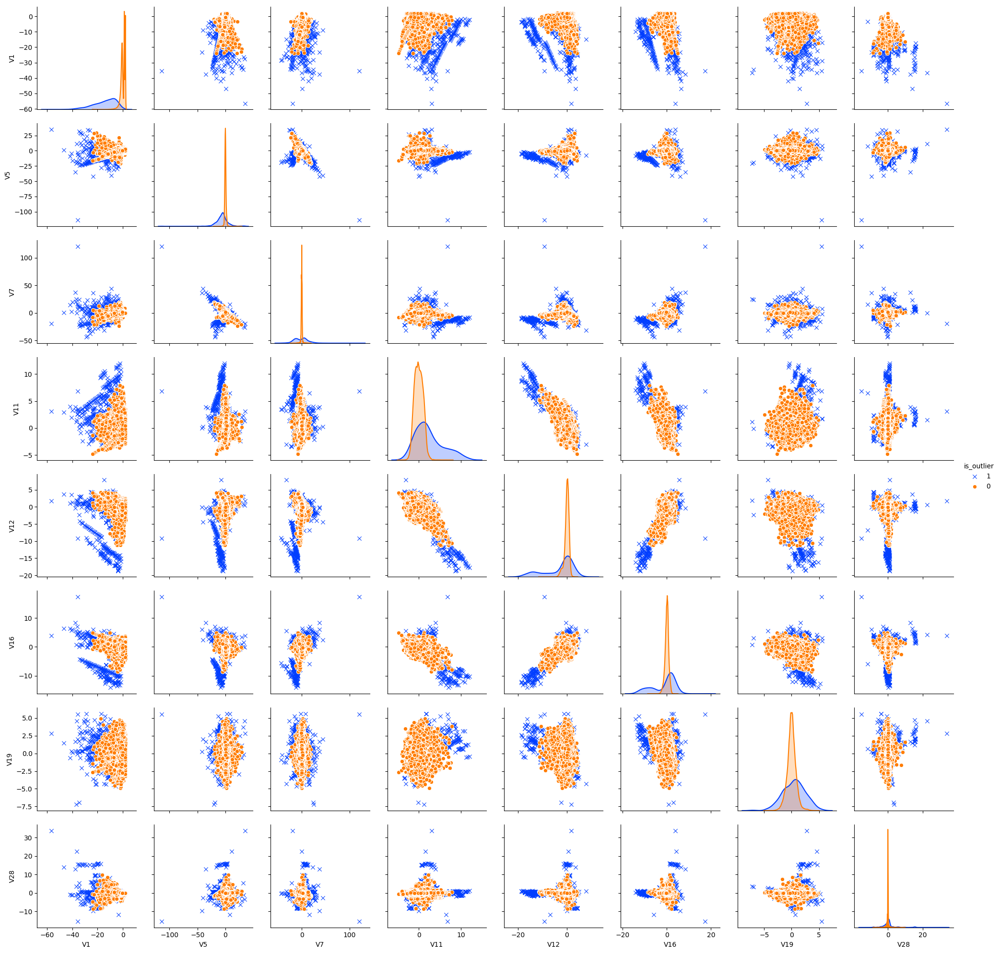

In [49]:
from IPython.display import Image
Image(filename='pairplot isolation_outliers.png')

# 6) Visualization via dimensionality reduction
постройте сжатое представление исходных данных и проверьте, действительно ли аномалии лежат достаточно далеко от основной массы точек 

# a) t-SNE (T-distributed Stochastic Neighbor Embedding)

In [28]:
from MulticoreTSNE import MulticoreTSNE as TSNE

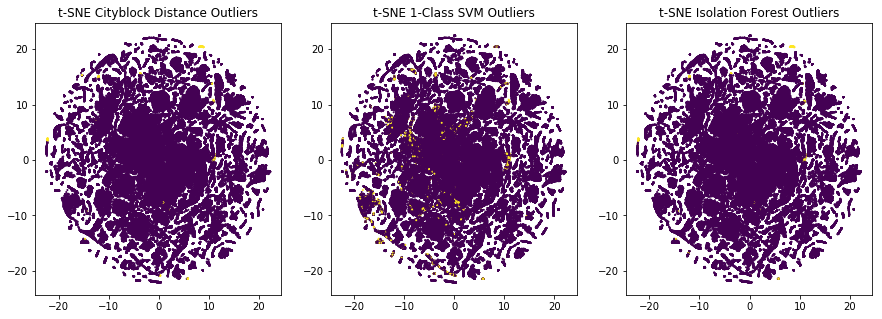

In [70]:
# perplexity=20

tsne = TSNE(perplexity=20, n_jobs=4)
tsne_transformed = tsne.fit_transform(scaled_data)
plt.figure(figsize=(15, 5))

plt.subplot(131, title='t-SNE Cityblock Distance Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=cityblock_outliers, s=1)

plt.subplot(132, title='t-SNE 1-Class SVM Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=svm_outliers, s=1)

plt.subplot(133, title='t-SNE Isolation Forest Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=isolation_outliers, s=1)

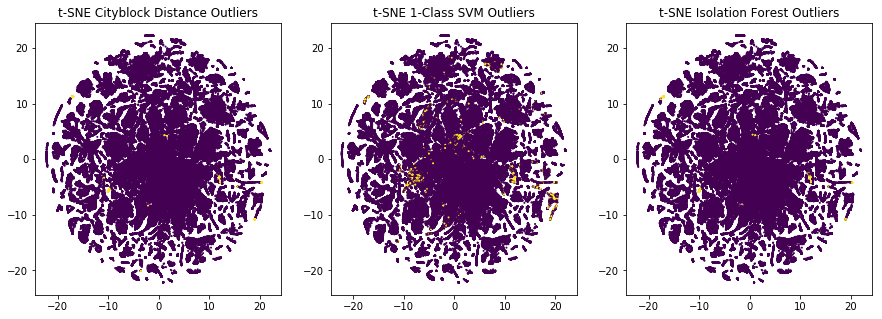

In [73]:
# perplexity=30

tsne = TSNE(perplexity=30, n_jobs=4)
tsne_transformed = tsne.fit_transform(scaled_data)

plt.figure(figsize=(15, 5))

plt.subplot(131, title='t-SNE Cityblock Distance Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=cityblock_outliers, s=1)

plt.subplot(132, title='t-SNE 1-Class SVM Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=svm_outliers, s=1)

plt.subplot(133, title='t-SNE Isolation Forest Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=isolation_outliers, s=1)

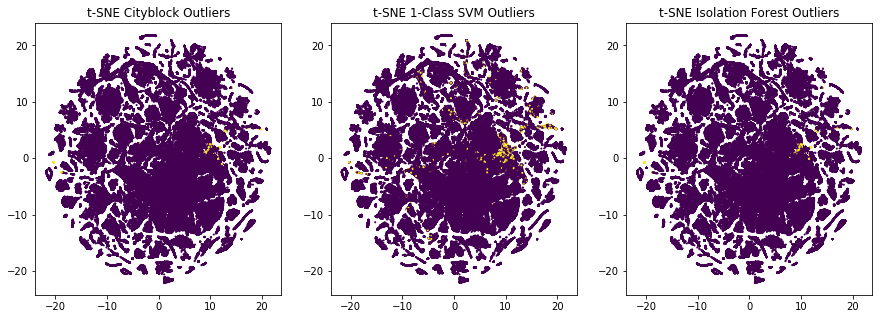

In [71]:
# perplexity=40

tsne = TSNE(perplexity=40, n_jobs=4)
tsne_transformed = tsne.fit_transform(scaled_data)
plt.figure(figsize=(15, 5))

plt.subplot(131, title='t-SNE Cityblock Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=cityblock_outliers, s=1)

plt.subplot(132, title='t-SNE 1-Class SVM Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=svm_outliers, s=1)

plt.subplot(133, title='t-SNE Isolation Forest Outliers')
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=isolation_outliers, s=1)

# b) UMAP (Uniform Manifold Approximation and Projection)

In [45]:
import umap

In [46]:
reducer = umap.UMAP(random_state=42)

In [47]:
embedding = reducer.fit_transform(scaled_data)

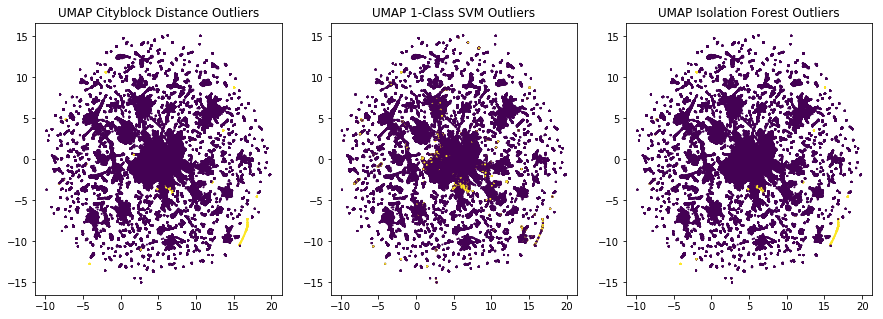

In [72]:
plt.figure(figsize=(15, 5))

plt.subplot(131, title='UMAP Cityblock Distance Outliers')
plt.scatter(embedding[:, 0], embedding[:, 1], c=cityblock_outliers, s=1)

plt.subplot(132, title='UMAP 1-Class SVM Outliers')
plt.scatter(embedding[:, 0], embedding[:, 1], c=svm_outliers, s=1)

plt.subplot(133, title='UMAP Isolation Forest Outliers')
plt.scatter(embedding[:, 0], embedding[:, 1], c=isolation_outliers, s=1)

- В пунке 4 было опрееделено, что наилучшие результаты показал Isolation forest, а наихудшие One-Class SVM
- Визуализации t-SNE и UMAP как раз показывают, что SVM определил большинство точек в центре визуализированного круга, когда другие методы определили больше точек аномалий по окружности круга
